# Aprendizaje por refuerzo
## Juan Pablo Maldonado Castro
### Toma de Decisiones
#### 23 de mayo de 2023


## Requerimientos

In [ ]:
!pip install swig

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 69.6 MB/s eta 0:00:00


In [ ]:
!pip3 install gymnasium[box2d]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 925.5/925.5 kB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 19.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.7/13.7 MB 69.1 MB/s eta 0:00:00
  Created wheel for box2d-py: filename=box2d_py-2.3.5-cp310-cp310-linux_x86_64.whl size=2812554 sha256=ef1bb8f890832fe7057f33599d930f8867b58a756b54535db91542d45b4c0fc0
  Stored in directory: /root/.cache/pip/wheels/db/8f/6a/eaaadf056fba10a98d986f6dce954e6201ba3126926fc5ad9e
Successfully built box2d-py
  Attempting uninstall: pygame
    Found existing installation: pygame 2.3.0
    Uninstalling pygame-2.3.0:
      Successfully uninstalled pygame-2.3.0


## Librerías

Para este proyecto nos apoyaremos principalmente de las siguientes librerías:
- `gymnasium` para tener ambientes de aprendizaje por refuerzo
- `torch` para implementar, entrenar y usar redes neuronales
- `matplotlib` para visualización de los ambientes en el notebook.

In [ ]:
import gymnasium as gym
import math
import random
from collections import namedtuple, deque
from itertools import count
import numpy as np
import time

import matplotlib.animation
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import json

## Utilidades de visualización

Para visualizar los resultados en este mismo notebook,  nos apoyaremos de las herramientas de visualización que definen en [este tutorial](https://github.com/ageron/handson-ml3/blob/main/18_reinforcement_learning.ipynb) de [Aurélien Geron](https://github.com/ageron).

In [ ]:

# set up matplotlib
is_ipython = 'inline' in matplotlib.get_backend()
if is_ipython:
    from IPython import display

In [ ]:
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('animation', html='jshtml')

In [ ]:
from pathlib import Path

IMAGES_PATH = Path() / "images" / "rl"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [ ]:
def plot_environment(env, figsize=(5, 4)):
    plt.figure(figsize=figsize)
    img = env.render()
    plt.imshow(img)
    plt.axis("off")
    return img

In [ ]:
def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')
    anim = matplotlib.animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim

def show_one_episode(env, policy, n_max_steps=200, seed=42):
    frames = []
    #env = gym.make("CartPole-v1", render_mode="rgb_array")
    #np.random.seed(seed)
    obs, info = env.reset()#seed=seed)
    for step in range(n_max_steps):
        frames.append(env.render())
        action = policy(obs)
        obs, reward, done, truncated, info = env.step(action)
        if done or truncated:
            break
    env.close()
    return plot_animation(frames)

# Aprendizaje por refuerzo usando DQN

El objetivo de este trabajo es implementar y utilizar el algoritmo de DQN para aplicar aprendizaje por refuerzo. Esto con el fin de resolver ambientes de accones discretas básicos.

Estos son los componentes de una DQN:
- Q-network:
    - Policy Net
    - Target Net
- Replay Memory
- Optimizador

## Replay Memory

Un aspecto fundamental del algoritmo de DQN es generar nuestro propio dataset de entrenamiento. Esto lo logramos con una memoria, donde vamos a ir guardando las acciones que hemos realizado previamente para aprender de ellas. Este componente se conoce como `Replay Memory` y lo que guardamos por cada observaciòn que hacemos en el ambiente es o siguiente:
- Estado (`state`)
- Acción (`action`) tomada a partir de `state`
- El estado (`next_state`) al que se llegó a partir de `action`
- La recompensa (`reward`) obtenida al llegar a `next_state`

Cada vez que consultemos la memoria es importante hacerlo a partir de un muestreo aleatorio, haciendo que las transiciones del batch que agarremos no estén correlacionadas entre sí, dando más varianza en los datos de entrenamiento.

Definimos este componente a partir de las siguientes clases:

- `Transition`: Una estructura de datos que guarda `state`, `action`, `next_state` y `reward`.
- `ReplayMemory`: Una clase donde almacenamos elementos de tipo `Transition` en una fila. Tiene operaciones clásicas de `push` y `pop` además de contar conla operación de generar un muestreo aleatorio a partir de los datos en la memoria a partir de `sample`.

In [ ]:
Transition = namedtuple("Transition",
                        ("state","action","next_state","reward"))
class ReplayMemory(object):
    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)
    
    def push(self, *args):
        self.memory.append(Transition(*args))
    
    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)
    
    def __len__(self):
        return len(self.memory)

## Q-Network

El objetivo del aprendizaje por refuerzo por *Q-learning* es poder determinar qué acciones a partir de distintos estados me generan una mayor recompensa a corto y/o largo plazo. Esto se hace a partir de *Q-values*, donde por cada estado tenemos un valor numérico asociado a cada acción posible. A partir de estas valores, el más grande determinará aquella acción que maximizará la recompensa. 

En *Q-learning* tradicional se usan tablas de valores que se actualizan iterativamente, pero para *Deep Q-Learning*, esto se generaliza en una red neuronal. Como una red neuronal es una función universal y diferenciable, entonces podemos crear una función tal que reciba de entrada un estado/observación del ambiente y regrese el conjunto de *Q-values* asociados a ese estado. 

Para hacer esto nos apoyaremos de la librería de `torch` y usaremos modelos como el que se muestran a continuación:

In [ ]:
def DQN_model(n_observations, n_actions):
    return nn.Sequential(
        nn.Linear(n_observations,128),
        nn.ReLU(),
        nn.Linear(128,128),
        nn.ReLU(),
        nn.Linear(128,n_actions)
    )

Haciendo una breve descripción de este modelo, simplemente consiste de capas lineales combinadas con la función de activación ReLU. Es una arquitectura bastante simple, pero lo suficientemente poderosa como para hacer tareas básicas de aprendizaje por refuerzo. Conforme aumenta la complejidad de los problemas es conveniente tratar diferentes arquitecturas y ver cuál tiene mejor desempeño en el problema.

Lo que siempre es importante considerar es que la entrada será el vector de observaciones del estado actual y el de salida serán los *Q-values* a manera de un tensor de $1\times\text{num_acciones}$.

## Entrenamiento

Ya tenemos los tres componentes básicos del aprendizaje por refuerzo:
- El ambiente `env`
- La memoria `ReplayMemory`
- La arquitectura de la red neuronal `DQN_model`

Lo que sigue es juntar todos estos de tal forma que podamos entrenar a la red neuronal a tomar buenas decisiones en el ambiente. Para ello vamos a tener que considerar los componentes que se mencionan a continuación:

### Selección de acciones

Recordemos que conforme vamos explorando el ambiente vamos guardando los datos en la memoria. Pero, lo importante aquí es, ¿cómo decidimos qué acciones tomar? Para ello tenemos que apoyarnos del concepto de explotar áreas que se vean prometedoras y a la vez no compromenternos totalmente con ellas con el fin de tener un espacio de búsqueda amplio. Para solucionar este problema nos apoyaremos del *Epsilon Greedy Policy*.

La idea de esta política de decisión es escoger una acción aleatoria con una probabilidad $ϵ$, delo contrario seleccionar la acción acorde a la red neuronal de decisión. Esto ayuda a explorar varias acciones del espacio de búsqueda con el fin de que agente no se quede estancado en un solo camino.

Conforme se va entrenando la red neuronal esta probabilidad va disminuyendo de tal forma que se empieza a depender cada vez más de la red neuronal de decisión, donde empezamos a suponer que ya hizo una exploración bastante amplia.

### Policy y Target Net
En el algoritmo de DQN vamos a usar dos redes neuronales a partir de la msima arquitectura:
- **Policy Net**: es la red neuronal que utilizamos para realizar la selección de acciones a partir del estado actual del ambiente. En otras palabras, es la que predice los *Q-values* esperados. Algo importante es que se optimiza constantemente en el ciclo de entrenamiento.
- **Target Net**: ésta recibe como entrada el siguiente estado (que habíamos guardado en la memoria) y predice el *Q-value* esperado a partir de él. Otra característica es que se actualiza más lentamente que la policy net. 

Podemos decir que si nos basamos en la ecuación de Bellman que se usa para este algoritmo:
$$
Q(s,a) = r + \gamma max_aQ^\pi(s',a)
$$

la policy net define la recompensa inmediata $r$ y la target net la recompensa futura $Q(s',\pi(s'))$.

Se ha observado previamente que entrenar estas dos arquitecturas a ritmos distintos estabiliza significativamente el entrenamiento.

### Función de pérdida y optimización

La manera en que actualizamos las redes neuronales es usando los datos de nuestra memoria. Apoyándonos de la recompensa que se obtuvo originalmente, vamos a compararla con la obtenida por la red neuronal y eso nos permitirá minimizar para obtener Q-values más acertados eventualmente.

$$
δ = Q(s,a) - (r + \gamma Q^\pi(s',\pi(s')))
$$

### Implementación

Implementando todos los puntos anteriores nos queda lo siguiente:

In [ ]:
class ReinforcementLearner:
    def __init__(
        self, 
        env,
        state_loader,
        model_function, 
        device, 
        batch_size = 128, 
        gamma = 0.99,
        eps_start = 0.9, 
        eps_end = 0.05, 
        eps_decay = 1000,
        lr = 1e-4):

        self.env = env
        self.state_loader = state_loader
        self.model_function = model_function
        self.device_str = device
        self.device = torch.device(device)
        self.batch_size = batch_size
        self.gamma = gamma
        self.eps_start = eps_start
        self.eps_end = eps_end
        self.eps_decay = eps_decay
        self.lr = lr
        
        self.policy_net = self.model_function().to(self.device)
        self.target_net = self.model_function().to(self.device)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        
        self.optimizer = optim.AdamW(self.policy_net.parameters(), lr = lr, amsgrad=True)
        self.memory = ReplayMemory(10000)

        self.episode_durations = []
        self.episode_times = []
        self.episode_average_rewards = []
        self.episode_total_rewards = []
        self.episode_average_losses = []
        self.episode_average_q_values = []
        self.steps_done = 0

    def save_model(self, policy_net_path, target_net_path, save_opt = False, opt_path = None,):
        torch.save(self.policy_net.state_dict(), policy_net_path)
        if not save_opt: return
        torch.save(self.optimizer.state_dict(), opt_path)

    def load_model(
        self, 
        policy_net_path, 
        target_net_path, 
        load_opt = False, 
        opt_path = None
    ):
        self.policy_net.load_state_dict(torch.load(policy_net_path, map_location=torch.device(self.device_str)))
        self.target_net.load_state_dict(torch.load(target_net_path, map_location=torch.device(self.device_str)))
        if load_opt:
            self.optimizer.load_state_dict(torch.load(opt_path, map_location=torch.device(self.device_str)))


    def select_action(self, state, use_only_policy = False):
        sample = random.random()
        eps_threshold = self.eps_end + (self.eps_start - self.eps_end)* math.exp(-1.*self.steps_done/self.eps_decay)
        self.steps_done += 1
        if sample > eps_threshold or use_only_policy:
            with torch.no_grad():
                return self.policy_net(state).max(1)[1].view(1,1)
        else:
            return torch.tensor([[self.env.action_space.sample()]], device = self.device, dtype = torch.long)


    def optimize_model(self):
        if len(self.memory) < self.batch_size: return None, None

        transitions = self.memory.sample(self.batch_size)
        batch = Transition(*zip(*transitions))

        non_final_mask = torch.tensor(tuple(map(lambda s: s is not None, batch.next_state)),
                                    device = self.device, dtype = torch.bool)
        non_final_next_states = torch.cat([s for s in batch.next_state if s is not None])

        state_batch = torch.cat(batch.state)
        action_batch = torch.cat(batch.action)
        reward_batch = torch.cat(batch.reward)

        state_action_values = self.policy_net(state_batch).gather(1,action_batch)

        next_state_values = torch.zeros(self.batch_size, device = self.device)

        with torch.no_grad():
            next_state_values[non_final_mask] = self.target_net(non_final_next_states).max(1)[0]

        # Q values
        expected_state_action_values = (next_state_values * self.gamma) + reward_batch

        criterion = nn.SmoothL1Loss()
        loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))
        self.optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_value_(self.policy_net.parameters(), 100)
        self.optimizer.step()

        with torch.no_grad():
            return expected_state_action_values, loss

    def fit(self, n_episodes, tau=0.005, save_average_reward_per_episode = True, n_episodes_for_average_reward = 5):
        #for i_episode in (pbar := tqdm(range(n_episodes), leave = True, position = 0)):
        for i_episode in range(n_episodes):
            summary_str = f"Episode {i_episode}:"
            start_time = time.time()
            # Initialize the environment and get it's state
            state, info = self.env.reset()
            state = self.state_loader(state, self.device) # For non-image
            #state = torch.tensor(state, dtype=torch.float32, device=self.device).permute(2,1,0).unsqueeze(0)
            episode_q_values = torch.tensor([]).to(self.device)
            episode_loss_values = torch.tensor([]).to(self.device)
            total_reward = 0
            for t in count():
                action = self.select_action(state)
                observation, reward, terminated, truncated, _ = self.env.step(action.item())
                total_reward += reward
                reward = torch.tensor([reward], device=self.device)
                done = terminated or truncated

                if terminated:
                    next_state = None
                else:
                    next_state = self.state_loader(observation,self.device)#torch.tensor(observation, dtype=torch.float32, device=self.device).unsqueeze(0)

                # Store the transition in memory
                self.memory.push(state, action, next_state, reward)

                # Move to the next state
                state = next_state

                # Perform one step of the optimization (on the policy network)
                q_values, loss = self.optimize_model()
                if q_values is not None and loss is not None: 
                    with torch.no_grad():
                        episode_q_values = torch.cat([episode_q_values,torch.max(q_values).reshape(1)])
                        episode_loss_values = torch.cat([episode_loss_values,loss.unsqueeze(0)])

                # Soft update of the target network's weights
                # θ′ ← τ θ + (1 −τ )θ′
                target_net_state_dict = self.target_net.state_dict()
                policy_net_state_dict = self.policy_net.state_dict()
                for key in policy_net_state_dict:
                    target_net_state_dict[key] = policy_net_state_dict[key]*tau + target_net_state_dict[key]*(1-tau)

                self.target_net.load_state_dict(target_net_state_dict)

                if done:
                    total_time = time.time() - start_time
                    self.episode_durations.append(t+1)
                    self.episode_times.append(total_time)
                    with torch.no_grad():
                        self.episode_average_losses.append(torch.mean(episode_loss_values))
                        self.episode_average_q_values.append(torch.mean(episode_q_values))
                    self.episode_total_rewards.append(total_reward)
                    summary_str += f'\n\t Duration {t+1}, Total reward {total_reward}, Total time: {total_time}, Avg Loss: {self.episode_average_losses[-1]}, Avg Q values: {self.episode_average_q_values[-1]}'
                    #self.episode_rewards.append(total_reward)    
                    break

            if save_average_reward_per_episode:
                rewards = self.get_model_rewards(n_episodes_for_average_reward,save=False)
                summary_str += f", Average reward: {np.mean(rewards)}"
            print(summary_str)
            #best_rewards.append(best_reward)
    
    def show_one_episode(self, n_max_steps=200, seed=None):
        frames = []
        if seed: 
            state,info = self.env.reset(seed=seed)
        else:
            state, info = self.env.reset()
        
        for step in range(n_max_steps):
            frames.append(self.env.render())
            state = self.state_loader(state, self.device)
            #obs = torch.tensor(obs, dtype = torch.float32, device = self.device).unsqueeze(0)
            action = self.select_action(state = state, use_only_policy = True)
            state, reward, done, truncated, info = self.env.step(action.item())
            if done or truncated:
                break
        self.env.close()
        return plot_animation(frames)


    def get_model_rewards(self, n_episodes, save = False, path = "./model_reward_results.json"):
        rewards = []
        
        for i_episode in range(n_episodes):
            cur_episode_rewards = []
            state,info = self.env.reset()
            while True:
                state = self.state_loader(state,self.device)#torch.tensor(obs, dtype = torch.float32, device = self.device).unsqueeze(0)
                action = self.select_action(state = state, use_only_policy = True)
                state, reward, done, truncated, info = self.env.step(action.item())
                cur_episode_rewards.append(reward)
                if done or truncated:
                    break
            rewards.append(sum(cur_episode_rewards))

        if not save: return rewards

        data = {
            "model_rewards": rewards
        }
        with open(path, "w") as f:
            json.dump(data, f, indent = 6)

        return rewards

    def save_learner_training_results(self, path):
        data = {
            "total_rewards": self.episode_total_rewards,
            "durations": self.episode_durations,
            "times": self.episode_times,
            "q-values_mean": torch.tensor(self.episode_average_q_values).tolist(),
            "loss_mean": torch.tensor(self.episode_average_losses).tolist()
        }

        with open(path,"w") as f:
            json.dump(data,f,indent=6)

# Ejemplos

A continuación se encuentran algunos ejemplos de ambientes de Gymnasium donde se muestra el desempeño de DQN tras correr por 600 épocas cada escenario.


## Lunar Lander

In [ ]:
env = gym.make(
    "LunarLander-v2",
    render_mode="rgb_array" # For visualization
)
state, info = env.reset()

n_actions = env.action_space.n
n_observations = len(state)

def observation_loader(state, device):
    return torch.tensor(state, dtype = torch.float32, device = device).unsqueeze(0)

def DQN_model():
    return nn.Sequential(
        nn.Linear(n_observations,128),
        nn.ReLU(),
        nn.Linear(128,128),
        nn.ReLU(),
        nn.Linear(128,n_actions)
    )


device_str = "cuda" if torch.cuda.is_available() else "cpu"

learner = ReinforcementLearner(env,observation_loader,DQN_model,device_str)

In [ ]:
learner.show_one_episode()

In [ ]:
random_results = learner.get_model_rewards(50, save = True, path = "./LunarLander_random_policy_results.json")

In [ ]:
np.mean(random_results)

-230.37805110641096

In [ ]:
np.max(random_results)

2.676000446143348

In [ ]:
learner.fit(600,save_average_reward_per_episode=False)

Episode 0:
	 Duration 58, Total reward -143.81434286143596, Total time: 0.0740962028503418, Avg Loss: nan, Avg Q values: nan
Episode 1:
	 Duration 57, Total reward -173.26884555563387, Total time: 0.056060791015625, Avg Loss: nan, Avg Q values: nan
Episode 2:
	 Duration 59, Total reward -380.5244526703971, Total time: 0.3233649730682373, Avg Loss: 2.6327231203505517, Avg Q values: 6.417365481489567
Episode 3:
	 Duration 53, Total reward -413.48205336332865, Total time: 0.2358546257019043, Avg Loss: 3.7712482486207315, Avg Q values: 6.017525311940291
Episode 4:
	 Duration 165, Total reward -511.41065454958033, Total time: 0.7579836845397949, Avg Loss: 3.2523897584579973, Avg Q values: 4.932109934095478
Episode 5:
	 Duration 77, Total reward -214.38019623119825, Total time: 0.3345794677734375, Avg Loss: 2.382679450085133, Avg Q values: 4.356039251969025
Episode 6:
	 Duration 60, Total reward -126.8998610505671, Total time: 0.2597661018371582, Avg Loss: 2.1932321882232513, Avg Q values: 9

In [ ]:
learner.show_one_episode(n_max_steps=1000)

In [ ]:
learner.save_model("LunarLander_DQN_basic_policy.pt","LunarLander_DQN_basic_target.pt",save_opt=True, opt_path="LunarLander_DQN_basic_optimizer.pt")

In [ ]:
learner.save_learner_training_results("LunarLander_DQN_basic_training_results.json")

In [ ]:
with open("LunarLander_DQN_basic_training_results.json") as f:
    data = json.load(f)

Text(0, 0.5, 'Q-value')

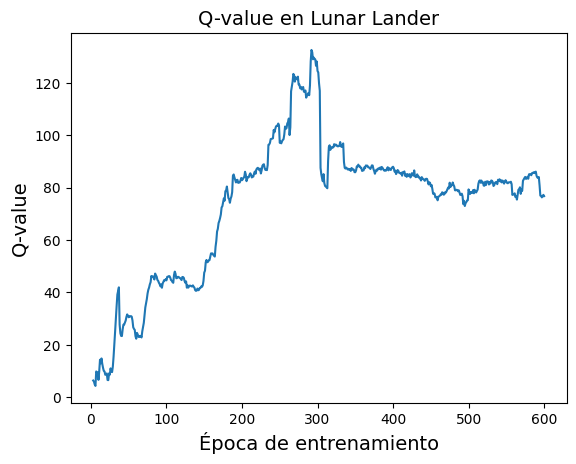

In [ ]:
plt.plot([i+1 for i in range(600)],data["q-values_mean"])
plt.title("Q-value en Lunar Lander")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Q-value")

Text(0, 0.5, 'Recompensa')

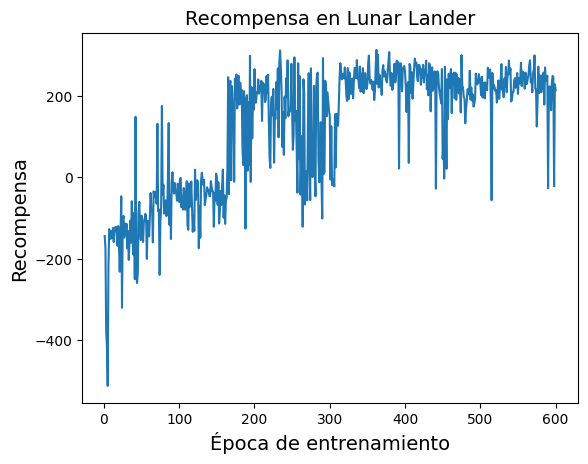

In [ ]:
plt.plot([i+1 for i in range(600)],data["total_rewards"])
plt.title("Recompensa en Lunar Lander")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Recompensa")

Text(0, 0.5, 'Smooth L1 Loss')

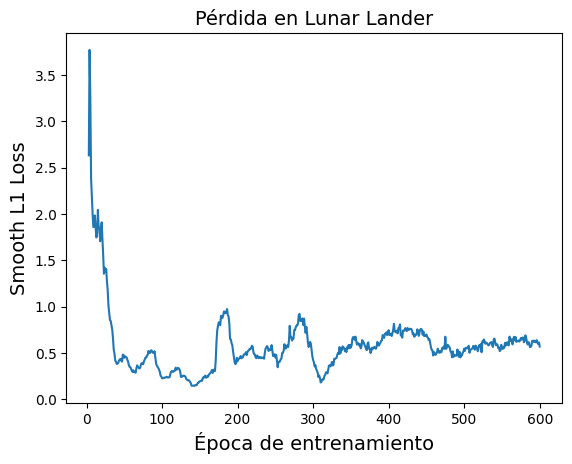

In [ ]:
plt.plot([i+1 for i in range(600)],data["loss_mean"])
plt.title("Pérdida en Lunar Lander")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Smooth L1 Loss")

In [ ]:
trained_results = learner.get_model_rewards(50)

In [ ]:
np.mean(trained_results)

214.16652983491352

In [ ]:
np.max(trained_results)

305.13929160357134

## Acrobot

In [ ]:
env = gym.make(
    "Acrobot-v1",
    render_mode="rgb_array" # For visualization
)
state, info = env.reset()

n_actions = env.action_space.n
n_observations = len(state)

def observation_loader(state, device):
    return torch.tensor(state, dtype = torch.float32, device = device).unsqueeze(0)

def DQN_model():
    return nn.Sequential(
        nn.Linear(n_observations,128),
        nn.ReLU(),
        nn.Linear(128,128),
        nn.ReLU(),
        nn.Linear(128,n_actions)
    )

device_str = "cuda" if torch.cuda.is_available() else "cpu"

learner = ReinforcementLearner(env,observation_loader,DQN_model,device_str)

In [ ]:
learner.show_one_episode(n_max_steps=500)

In [ ]:
random_results = learner.get_model_rewards(50)#, save = True, path = "./LunarLander_random_policy_results.json")

In [ ]:
np.mean(random_results)

-371.38

In [ ]:
np.max(random_results)

-217.0

In [ ]:
learner.fit(600,save_average_reward_per_episode=False)

Episode 0:
	 Duration 381, Total reward -380.0, Total time: 1.0955278873443604, Avg Loss: 0.12404053658246994, Avg Q values: -0.9833879470825195
Episode 1:
	 Duration 500, Total reward -500.0, Total time: 1.908158779144287, Avg Loss: 0.009087756276130676, Avg Q values: -1.5585826635360718
Episode 2:
	 Duration 500, Total reward -500.0, Total time: 1.9650769233703613, Avg Loss: 0.005797248333692551, Avg Q values: -3.2771451473236084
Episode 3:
	 Duration 500, Total reward -500.0, Total time: 2.343601942062378, Avg Loss: 0.005353041924536228, Avg Q values: -5.126986026763916
Episode 4:
	 Duration 500, Total reward -500.0, Total time: 2.216071128845215, Avg Loss: 0.005708500277251005, Avg Q values: -6.9400763511657715
Episode 5:
	 Duration 500, Total reward -500.0, Total time: 1.8786420822143555, Avg Loss: 0.00818698201328516, Avg Q values: -8.540873527526855
Episode 6:
	 Duration 500, Total reward -500.0, Total time: 1.9215848445892334, Avg Loss: 0.008823213167488575, Avg Q values: -10.4

In [ ]:
learner.show_one_episode(n_max_steps=500)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
learner.save_model("Acrobot_DQN_basic_policy.pt","Acrobot_DQN_basic_target.pt",save_opt=True, opt_path="Acrobot_DQN_basic_optimizer.pt")

In [ ]:
learner.save_learner_training_results("Acrobot_DQN_basic_training_results.json")

In [ ]:
with open("Acrobot_DQN_basic_training_results.json") as f:
    data = json.load(f)

Text(0, 0.5, 'Q-value')

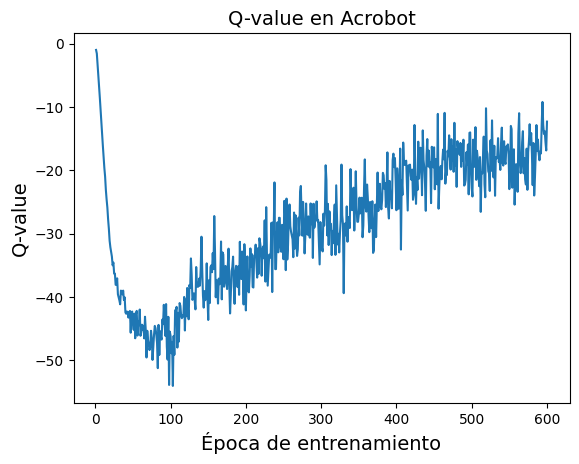

In [ ]:
plt.plot([i+1 for i in range(600)],data["q-values_mean"])
plt.title("Q-value en Acrobot")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Q-value")

Text(0, 0.5, 'Recompensa')

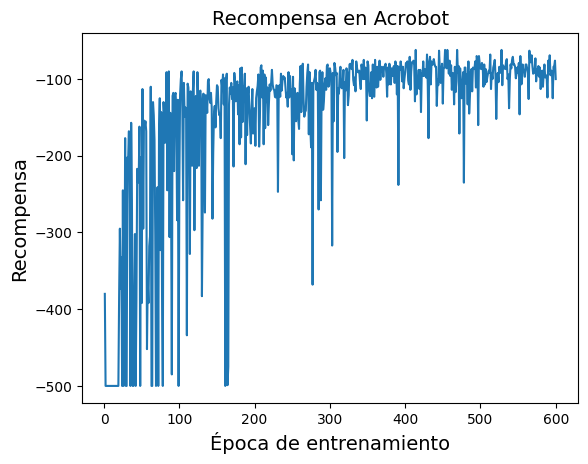

In [ ]:
plt.plot([i+1 for i in range(600)],data["total_rewards"])
plt.title("Recompensa en Acrobot")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Recompensa")

Text(0, 0.5, 'Smooth L1 Loss')

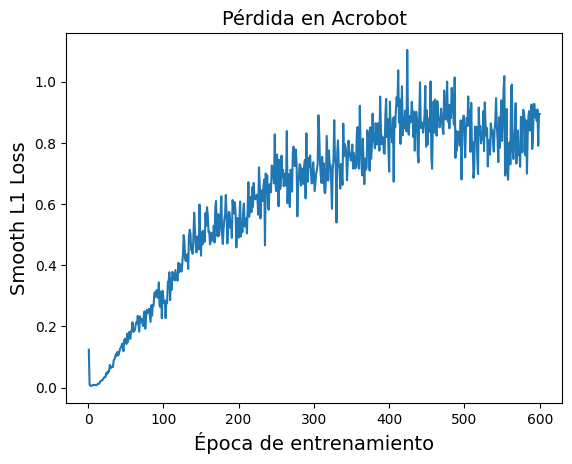

In [ ]:
plt.plot([i+1 for i in range(600)],data["loss_mean"])
plt.title("Pérdida en Acrobot")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Smooth L1 Loss")

In [ ]:
trained_results = learner.get_model_rewards(50)

In [ ]:
np.mean(trained_results)

-91.38

In [ ]:
np.max(trained_results)

-72.0

## Cart Pole

In [ ]:
env = gym.make(
    "CartPole-v1",
    render_mode="rgb_array" # For visualization
)
state, info = env.reset()

n_actions = env.action_space.n
n_observations = len(state)

def observation_loader(state, device):
    return torch.tensor(state, dtype = torch.float32, device = device).unsqueeze(0)

def DQN_model():
    return nn.Sequential(
        nn.Linear(n_observations,128),
        nn.ReLU(),
        nn.Linear(128,128),
        nn.ReLU(),
        nn.Linear(128,n_actions)
    )

device_str = "cuda" if torch.cuda.is_available() else "cpu"

learner = ReinforcementLearner(env,observation_loader,DQN_model,device_str)

In [ ]:
learner.show_one_episode()

In [ ]:
random_results = learner.get_model_rewards(50)

In [ ]:
np.mean(random_results)

21.2

In [ ]:
np.max(random_results)

30.0

In [ ]:
learner.fit(600,save_average_reward_per_episode=False)

Episode 0:
	 Duration 9, Total reward 9.0, Total time: 0.011493682861328125, Avg Loss: nan, Avg Q values: nan
Episode 1:
	 Duration 10, Total reward 10.0, Total time: 0.008189201354980469, Avg Loss: nan, Avg Q values: nan
Episode 2:
	 Duration 37, Total reward 37.0, Total time: 0.026042461395263672, Avg Loss: nan, Avg Q values: nan
Episode 3:
	 Duration 22, Total reward 22.0, Total time: 0.017592430114746094, Avg Loss: nan, Avg Q values: nan
Episode 4:
	 Duration 15, Total reward 15.0, Total time: 0.01502370834350586, Avg Loss: nan, Avg Q values: nan
Episode 5:
	 Duration 16, Total reward 16.0, Total time: 0.011960744857788086, Avg Loss: nan, Avg Q values: nan
Episode 6:
	 Duration 24, Total reward 24.0, Total time: 0.035031795501708984, Avg Loss: 0.5259436964988708, Avg Q values: 1.1423019170761108
Episode 7:
	 Duration 13, Total reward 13.0, Total time: 0.04262065887451172, Avg Loss: 0.473689466714859, Avg Q values: 1.1470216512680054
Episode 8:
	 Duration 10, Total reward 10.0, Tota

In [ ]:
learner.show_one_episode(n_max_steps=500)

In [ ]:
learner.save_model("CartPole_DQN_basic_policy.pt","CartPole_DQN_basic_target.pt",save_opt=True, opt_path="CartPole_DQN_basic_optimizer.pt")

In [ ]:
learner.save_learner_training_results("Cartpole_DQN_basic_training_results.json")

In [ ]:
with open("./Cartpole_DQN_basic_training_results.json") as f:
    data = json.load(f)

Text(0, 0.5, 'Q-value')

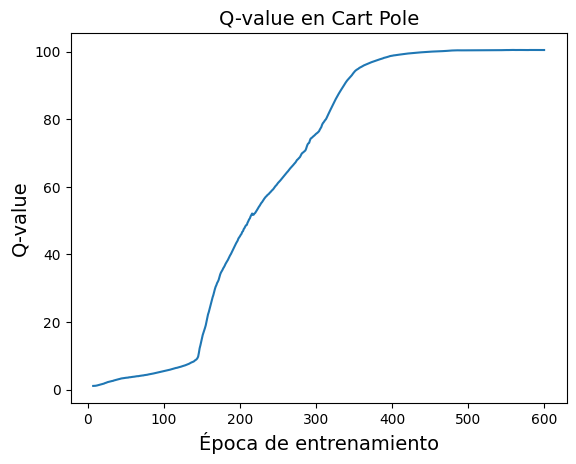

In [ ]:
plt.plot([i+1 for i in range(600)],data["q-values_mean"])
plt.title("Q-value en Cart Pole")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Q-value")

Text(0, 0.5, 'Recompensa')

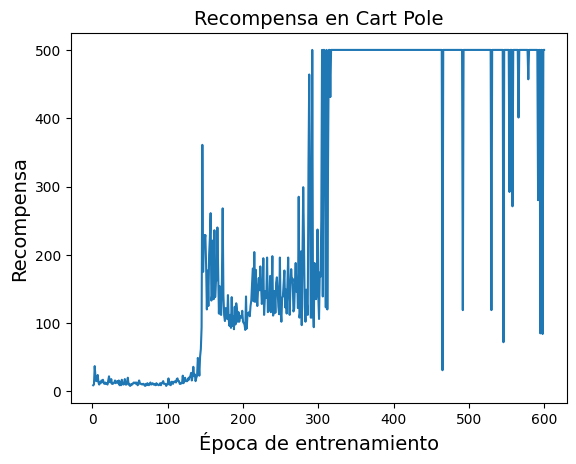

In [ ]:
plt.plot([i+1 for i in range(600)],data["total_rewards"])
plt.title("Recompensa en Cart Pole")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Recompensa")

Text(0, 0.5, 'Smooth L1 Loss')

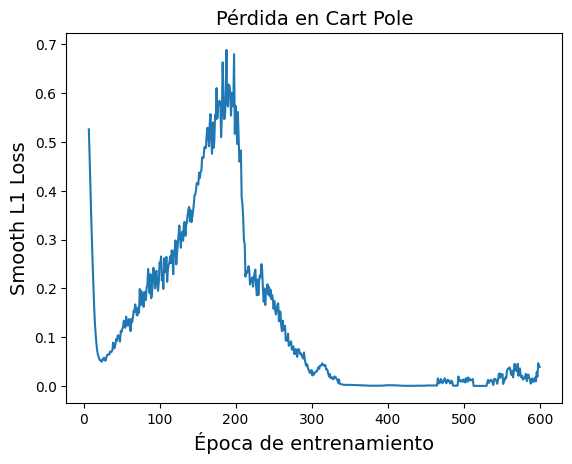

In [ ]:
plt.plot([i+1 for i in range(600)],data["loss_mean"])
plt.title("Pérdida en Cart Pole")
plt.xlabel("Época de entrenamiento")
plt.ylabel("Smooth L1 Loss")

In [ ]:
trained_results = learner.get_model_rewards(50)

In [ ]:
np.mean(trained_results)

500.0

In [ ]:
np.max(trained_results)

500.0

## Conclusiones
El aprendizaje por refuerzo representa un reto totalmente distinto a otras técnicas de aprendizaje supervisado o no supervisado. Al no contar con un dataset claro, la única alternativa que queda es la simulación del ambiente y aprovechar las observaciones simuladas para ir generando resultados ideales.

El mayor problema es que es un método bastante costoso en el sentido de que  ocupamos estar simulando constantemente el ambiente. El mayor problema del método de DQN es que está limitado a acciones discretas. Se ha observado que al tratar de usar este algoritmo en ambientes que ocupen de tomar decisiones en un espacio continuo.

# Referencia 
https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html

https://gymnasium.farama.org/

